In [1]:
%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
import torch, torch.nn as nn, torch.nn.functional as F
import torchvision.models as models
import lightning as L
from datasets import load_dataset

In [3]:
dataset = load_dataset('../../astroclip/datasets/legacy_survey.py', 
                       cache_dir='/mnt/home/flanusse/ceph/huggingface/datasets')

# Format the dataset for pytorch
dataset.set_format(type='torch', columns=['image', 'spectrum'])

In [4]:
# Create the dataloaders
train_dataloader = torch.utils.data.DataLoader(dataset['train'], batch_size=512, shuffle=True, num_workers=10)
val_dataloader = torch.utils.data.DataLoader(dataset['test'], batch_size=512, shuffle=False, num_workers=10)

/mnt/home/flanusse/.local/lib/python3.10/site-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 10 worker processes in total. Our suggested max number of worker in current system is 6, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [5]:
class MLP(nn.Sequential):
    """Multi-Layer Perceptron

    A simple implementation with a configurable number of hidden layers and
    activation functions.

    Parameters
    ----------
    n_in: int
        Input dimension
    n_out: int
        Output dimension
    n_hidden: list of int
        Dimensions for every hidden layer
    act: list of callables
        Activation functions after every layer. Needs to have len(n_hidden) + 1
        If `None`, will be set to `LeakyReLU` for every layer.
    dropout: float
        Dropout probability
    """

    def __init__(self, n_in, n_out, n_hidden=(16, 16, 16), act=None, dropout=0):

        if act is None:
            act = [
                nn.LeakyReLU(),
            ] * (len(n_hidden) + 1)
        assert len(act) == len(n_hidden) + 1

        layer = []
        n_ = [n_in, *n_hidden, n_out]
        for i in range(len(n_) - 1):
            layer.append(nn.Linear(n_[i], n_[i + 1]))
            layer.append(act[i])
            layer.append(nn.Dropout(p=dropout))

        super(MLP, self).__init__(*layer)


class SpectrumEncoder(nn.Module):
    """Spectrum encoder

    Modified version of the encoder by Serrà et al. (2018), which combines a 3 layer CNN
    with a dot-product attention module. This encoder adds a MLP to further compress the
    attended values into a low-dimensional latent space.

    Paper: Serrà et al., https://arxiv.org/abs/1805.03908

    Parameters
    ----------
    instrument: :class:`spender.Instrument`
        Instrument that observed the data
    n_latent: int
        Dimension of latent space
    n_hidden: list of int
        Dimensions for every hidden layer of the :class:`MLP`
    act: list of callables
        Activation functions after every layer. Needs to have len(n_hidden) + 1
        If `None`, will be set to `LeakyReLU` for every layer.
    dropout: float
        Dropout probability
    """

    def __init__(
        self, instrument, n_latent, n_hidden=(128, 64, 32), act=None, dropout=0
    ):

        super(SpectrumEncoder, self).__init__()
        self.instrument = instrument
        self.n_latent = n_latent
        
        filters = [128, 256, 512]
        sizes = [5, 11, 21]
        self.conv1, self.conv2, self.conv3 = self._conv_blocks(
            filters, sizes, dropout=dropout
        )
        self.n_feature = filters[-1] // 2

        # pools and softmax work for spectra and weights
        self.pool1, self.pool2 = tuple(
            nn.MaxPool1d(s, padding=s // 2) for s in sizes[:2]
        )
        self.softmax = nn.Softmax(dim=-1)

        # small MLP to go from CNN features to latents
        if act is None:
            act = [nn.PReLU(n) for n in n_hidden]
            # last activation identity to have latents centered around 0
            act.append(nn.Identity())
        self.mlp = MLP(self.n_feature, self.n_latent, n_hidden=n_hidden, act=act, dropout=dropout)

    def _conv_blocks(self, filters, sizes, dropout=0):
        convs = []
        for i in range(len(filters)):
            f_in = 1 if i == 0 else filters[i - 1]
            f = filters[i]
            s = sizes[i]
            p = s // 2
            conv = nn.Conv1d(
                in_channels=f_in,
                out_channels=f,
                kernel_size=s,
                padding=p,
            )
            norm = nn.InstanceNorm1d(f)
            act = nn.PReLU(f)
            drop = nn.Dropout(p=dropout)
            convs.append(nn.Sequential(conv, norm, act, drop))
        return tuple(convs)

    def _downsample(self, x):
        # compression
        x = x.unsqueeze(1)
        x = self.pool1(self.conv1(x))
        x = self.pool2(self.conv2(x))
        x = self.conv3(x)
        C = x.shape[1] // 2
        # split half channels into attention value and key
        h, a = torch.split(x, [C, C], dim=1)

        return h, a

    def forward(self, y):
        """Forward method

        Parameters
        ----------
        y: `torch.tensor`, shape (N, L)
            Batch of observed spectra

        Returns
        -------
        s: `torch.tensor`, shape (N, n_latent)
            Batch of latents that encode `spectra`
        """
        # run through CNNs
        h, a = self._downsample(y)
        # softmax attention
        a = self.softmax(a)

        # attach hook to extract backward gradient of a scalar prediction
        # for Grad-FAM (Feature Activation Map)
        if ~self.training and a.requires_grad == True:
            a.register_hook(self._attention_hook)

        # apply attention
        x = torch.sum(h * a, dim=2)

        # run attended features into MLP for final latents
        x = self.mlp(x)
        return x

    @property
    def n_parameters(self):
        """Number of parameters in this model"""
        return sum(p.numel() for p in self.parameters() if p.requires_grad)

    def _attention_hook(self, grad):
        self._attention_grad = grad

    @property
    def attention_grad(self):
        """Gradient of the attention weights

        Factor to compute the importance of attention for Grad-FAM method.

        Requires a previous `loss.backward` call for any scalar loss function based on
        outputs of this class's `forward` method. This functionality is switched off
        during training.
        """
        if hasattr(self, "_attention_grad"):
            return self._attention_grad
        else:
            return None

In [6]:
# Let's define our architectures
image_encoder = models.resnet18(num_classes=1024, weights=None)
spectrum_encoder = SpectrumEncoder(None, 1024)

## Actual training code

In [7]:
class CLIPLoss(nn.Module):
    def get_logits(self, image_features, spectrum_features, logit_scale):
        logits_per_image = logit_scale * image_features @ spectrum_features.T
        logits_per_spectrum = logit_scale * spectrum_features @ image_features.T
        return logits_per_image, logits_per_spectrum

    def forward(self, image_features, spectrum_features, logit_scale, output_dict=False):
        logits_per_image, logits_per_spectrum = self.get_logits(image_features, spectrum_features, logit_scale)
        labels = torch.arange(logits_per_image.shape[0], device=image_features.device, dtype=torch.long)
        total_loss = (
            F.cross_entropy(logits_per_image, labels) +
            F.cross_entropy(logits_per_spectrum, labels)
        ) / 2
        return {"contrastive_loss": total_loss} if output_dict else total_loss

In [8]:
class LitCLIP(L.LightningModule):
    def __init__(self, image_encoder, spectrum_encoder):
        super().__init__()
        self.image_encoder = image_encoder
        self.spectrum_encoder = spectrum_encoder
        self.logit_scale = nn.Parameter(torch.ones([]) * np.log(1 / 0.07))
        self.criterion = CLIPLoss()
        
    def forward(self, x, image=True):
        if image:
            embedding = self.image_encoder(x)
        else:
            embedding = self.spectrum_encoder(x)
        return embedding

    def training_step(self, batch, batch_idx):
        # training_step defines the train loop. It is independent of forward
        im, sp = batch['image'].transpose(1,3), batch['spectrum'].squeeze()
        image_features = self.image_encoder(im)
        spectrum_features = self.spectrum_encoder(sp)
        
        loss = self.criterion(image_features, spectrum_features, self.logit_scale.exp())
        self.log("train_loss", loss)
        self.log("scale", self.logit_scale)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=5e-4)
        return optimizer

In [9]:
CLIP = LitCLIP(image_encoder, spectrum_encoder)

In [10]:
from lightning.pytorch.callbacks import ModelCheckpoint

trainer = L.Trainer(callbacks=[
            ModelCheckpoint(
                every_n_epochs=5,
            )]
            )

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [ ]:
trainer.fit(model=CLIP, 
            train_dataloaders=train_dataloader, 
            val_dataloaders=val_dataloader)

## Looking at the results

In [11]:
import numpy as np
import h5py
from PIL import Image as im

def sdss_rgb(imgs, bands, scales=None,
             m = 0.02):
    import numpy as np
    rgbscales = {'u': (2,1.5), #1.0,
                 'g': (2,2.5),
                 'r': (1,1.5),
                 'i': (0,1.0),
                 'z': (0,0.4), #0.3
                 }
    if scales is not None:
        rgbscales.update(scales)

    I = 0
    for img,band in zip(imgs, bands):
        plane,scale = rgbscales[band]
        img = np.maximum(0, img * scale + m)
        I = I + img
    I /= len(bands)
        
    # b,g,r = [rimg * rgbscales[b] for rimg,b in zip(imgs, bands)]
    # r = np.maximum(0, r + m)
    # g = np.maximum(0, g + m)
    # b = np.maximum(0, b + m)
    # I = (r+g+b)/3.
    Q = 20
    fI = np.arcsinh(Q * I) / np.sqrt(Q)
    I += (I == 0.) * 1e-6
    H,W = I.shape
    rgb = np.zeros((H,W,3), np.float32)
    for img,band in zip(imgs, bands):
        plane,scale = rgbscales[band]
        rgb[:,:,plane] = (img * scale + m) * fI / I

    # R = fI * r / I
    # G = fI * g / I
    # B = fI * b / I
    # # maxrgb = reduce(np.maximum, [R,G,B])
    # # J = (maxrgb > 1.)
    # # R[J] = R[J]/maxrgb[J]
    # # G[J] = G[J]/maxrgb[J]
    # # B[J] = B[J]/maxrgb[J]
    # rgb = np.dstack((R,G,B))
    rgb = np.clip(rgb, 0, 1)
    return rgb

def dr2_rgb(rimgs, bands, **ignored):
    return sdss_rgb(rimgs, bands, scales=dict(g=(2,6.0), r=(1,3.4), z=(0,2.2)), m=0.03)

In [12]:
# Loading the last saved checkpoint
CLIP = LitCLIP.load_from_checkpoint('lightning_logs/version_12/checkpoints/epoch=164-step=51150.ckpt',
                                 image_encoder=image_encoder, 
                                 spectrum_encoder=spectrum_encoder)

In [13]:
testdata = torch.utils.data.DataLoader(dataset['test'], batch_size=512, shuffle=False, num_workers=10)

In [14]:
from tqdm import tqdm
embeddings = []
images = []
for batch_test in tqdm(testdata):
    images.append(np.stack([clip(dr2_rgb(i.cpu().T, bands=['g', 'r', 'z']),0,1) for i in batch_test['image']] ,axis=0))
    embeddings.append(CLIP(batch_test['image'].transpose(1,3).to('cuda')).detach().cpu().numpy())

  0%|          | 0/78 [00:00<?, ?it/s]/tmp/ipykernel_791033/1304807230.py:5: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3571.)
  images.append(np.stack([clip(dr2_rgb(i.cpu().T, bands=['g', 'r', 'z']),0,1) for i in batch_test['image']] ,axis=0))
100%|██████████| 78/78 [01:00<00:00,  1.29it/s]


In [15]:
images = np.concatenate(images, axis=0)
embeddings = np.concatenate(embeddings, axis=0)

In [16]:
print(images.shape, embeddings.shape)

(39596, 152, 152, 3) (39596, 1024)


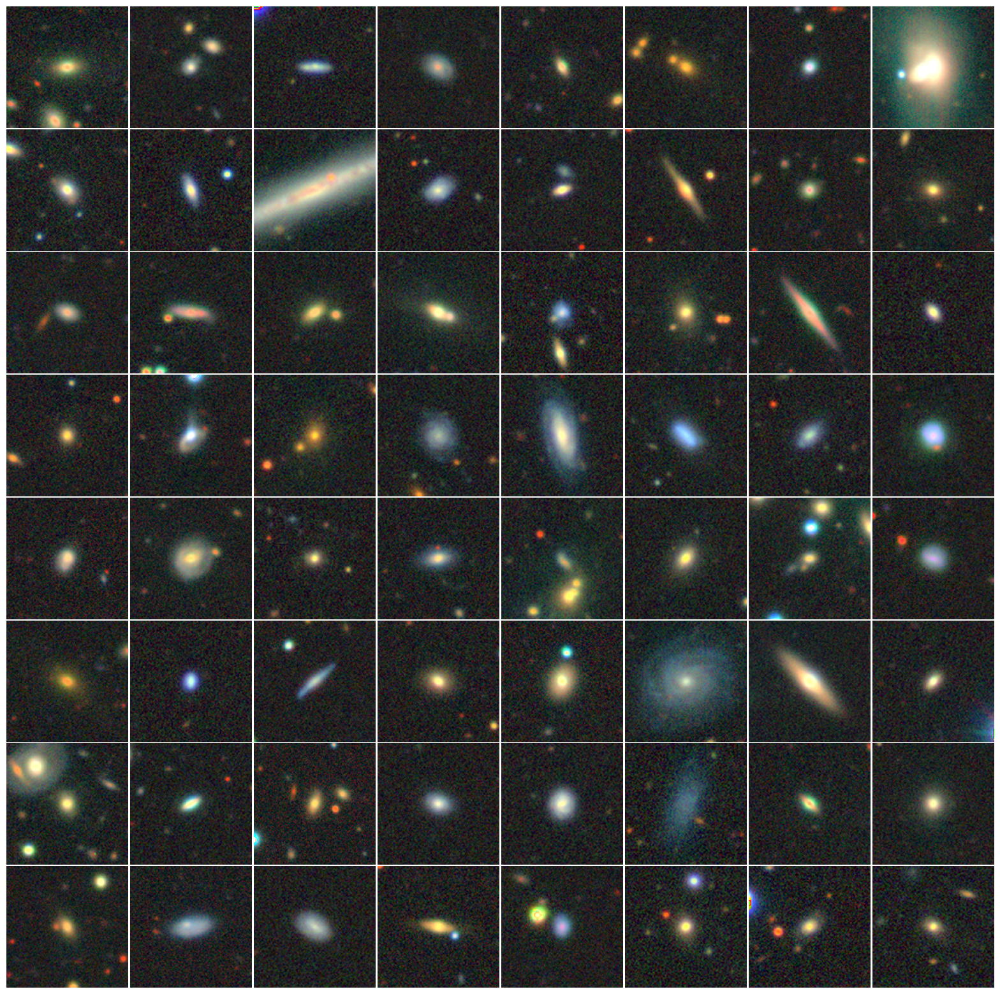

In [17]:
figure(figsize=[20,20])
for i in range(8):
    for j in range(8):
        subplot(8, 8, i * 8 +j +1)
        imshow(images[i * 8 +j])
        axis('off')
plt.subplots_adjust(wspace=0.01, hspace=0.01)

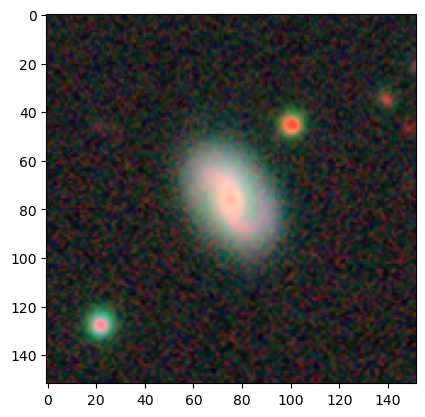

In [46]:
imshow(images[66])

In [47]:
cos = torch.nn.CosineSimilarity(dim=1, eps=1e-6)
sim = cos(torch.from_numpy(embeddings[66].reshape(1,-1)), torch.from_numpy(embeddings)).cpu().detach().numpy()

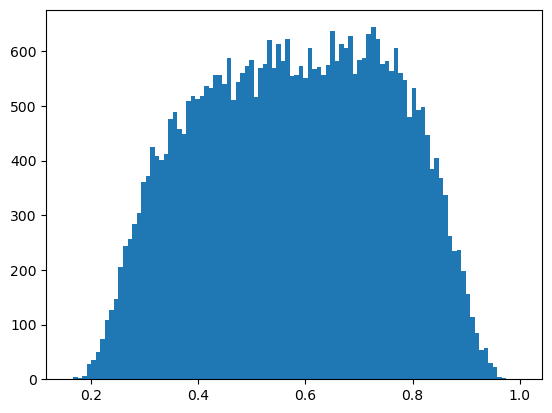

In [48]:
hist(sim,100);

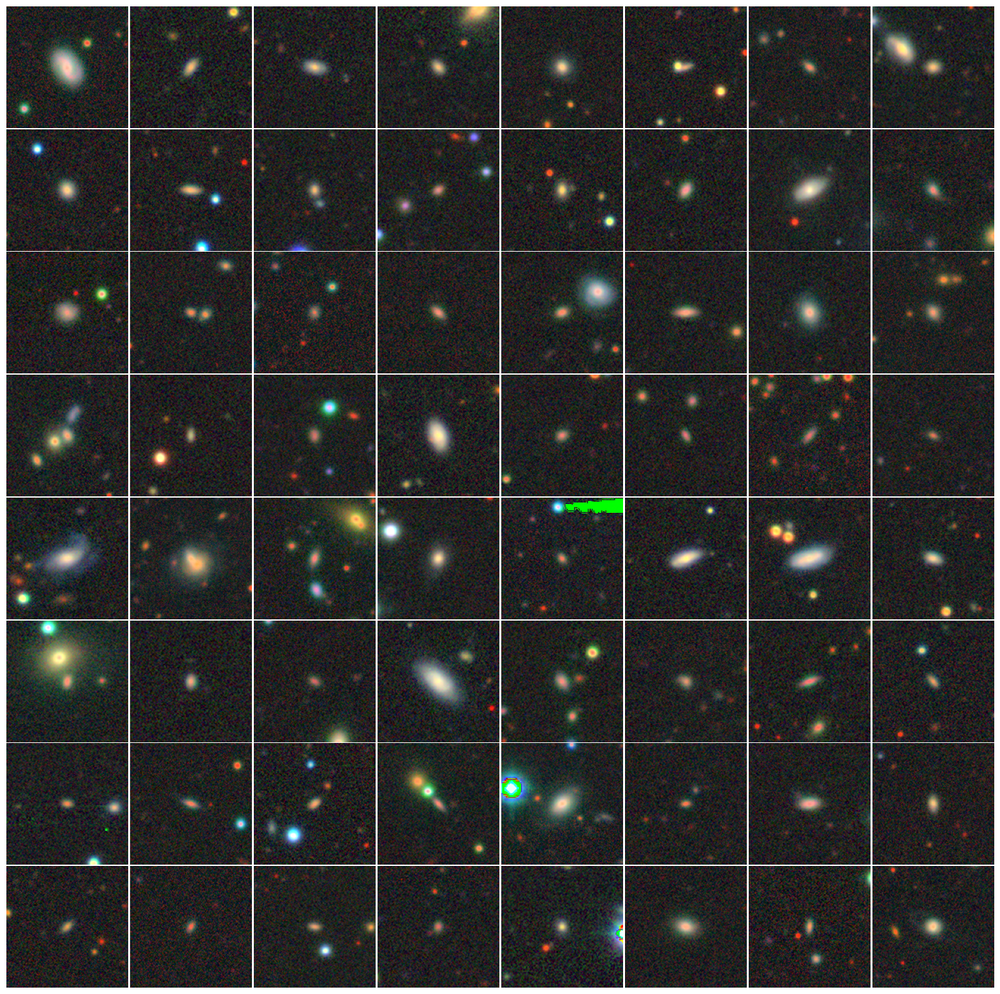

In [49]:
s = sim
inds = argsort(s)[::-1]
figure(figsize=[20,20])
for i in range(8):
    for j in range(8):
        subplot(8, 8, i * 8 +j +1)
        imshow(images[inds[i * 8 +j]])
        axis('off')
plt.subplots_adjust(wspace=0.01, hspace=0.01)